<a href="https://colab.research.google.com/github/romanbash/DTSA-5511-I-m-Something-of-a-Painter-Myself/blob/main/CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***DTSA-5511: Week 5 - I’m Something of a Painter Myself
***

## Github: https://github.com/romanbash/DTSA-5511-I-m-Something-of-a-Painter-Myself

## Part 1: Brief Description of the Problem and Data

**Problem**: The challenge in this project is to build a generative model that can generate images in the style of Monet paintings, given a dataset of real photos. The building involves training a model to learn the underlying patterns and features of Monet's style and then using this knowledge to transform photos into Monet-like images.
Generative deep learning models are a class of neural networks that can generate new data samples similar to the training data. They learn the underlying distribution of the training data and then sample from this distribution to create new samples. Examples include GANs (Generative Adversarial Networks) and VAEs (Variational Autoencoders). In this case, the CycleGAN model, a type of GAN, has been employed.

**Data**: The data consists of two datasets:
*Photos*: Real-world photos in JPEG format. *Monet Paintings*: Paintings by Claude Monet in JPEG format.

**Data Size:** The photos dataset contains about 7038 images. The Monet Paintings dataset contains about 300 images.

**Data Dimension and Structure:** The images are 256x256 pixels with three color channels (RGB). The data is structured as TFRecords for efficient loading and processing.

First, Let's import all the packages we would use in our project.

In [1]:
import tensorflow.keras as keras
from google.colab import drive
import tensorflow as tf
import os
import pickle
from tensorflow import keras
from google.colab import drive
import tensorflow as tf
import os
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import tensorflow.keras as keras
import time
import itertools


from keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dense, Input, InputLayer, Dropout, Activation, LeakyReLU, ReLU, BatchNormalization, Reshape, Flatten, Conv2DTranspose, UpSampling2D, Concatenate, ZeroPadding2D
from tensorflow.keras.optimizers import Adam
autotune = tf.data.experimental.AUTOTUNE

drive.mount('/content/drive')

Mounted at /content/drive


Let's check if the GPU works.

In [2]:
# Check for GPU availability
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available")

# Specify the GPU device to use
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Enable GPU acceleration
tf.keras.backend.set_image_data_format('channels_last')
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    # Invalid device or cannot modify virtual devices once initialized.
    pass

GPU is available


Specify the GPU device to use.

In [3]:
# Specify the GPU device to use
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Enable GPU acceleration
tf.keras.backend.set_image_data_format('channels_last')
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    # Invalid device or cannot modify virtual devices once initialized.
    pass

This hack if for quicker IO of pictures. We unzip all the data to "/content".

In [4]:
!unzip -q "/content/drive/MyDrive/DTSA 5511/Week 5/gan-getting-started.zip" -d "/content"

This is out base folder.

In [5]:

base_dir = '/content'


# Exploratory Data Analysis

In [6]:
photoFilenames = tf.io.gfile.glob(base_dir + '/photo_tfrec/*.tfrec')
monetFilenames = tf.io.gfile.glob(base_dir + '/monet_tfrec/*.tfrec')

print('Photo tfRecord File Count:', len(photoFilenames))
print('Monet tfRecord File Count:', len(monetFilenames))

Photo tfRecord File Count: 20
Monet tfRecord File Count: 5


In [7]:
monet_jpg = tf.io.gfile.glob(base_dir + '/monet_jpg/*.jpg')
photo_jpg = tf.io.gfile.glob(base_dir + '/photo_jpg/*.jpg')

print('Photo JPG Count:', len(photo_jpg))
print('Monet JPG Count:', len(monet_jpg))

Photo JPG Count: 7038
Monet JPG Count: 300


Let's plot the image size of an random image tfrec folders and jpeg folders


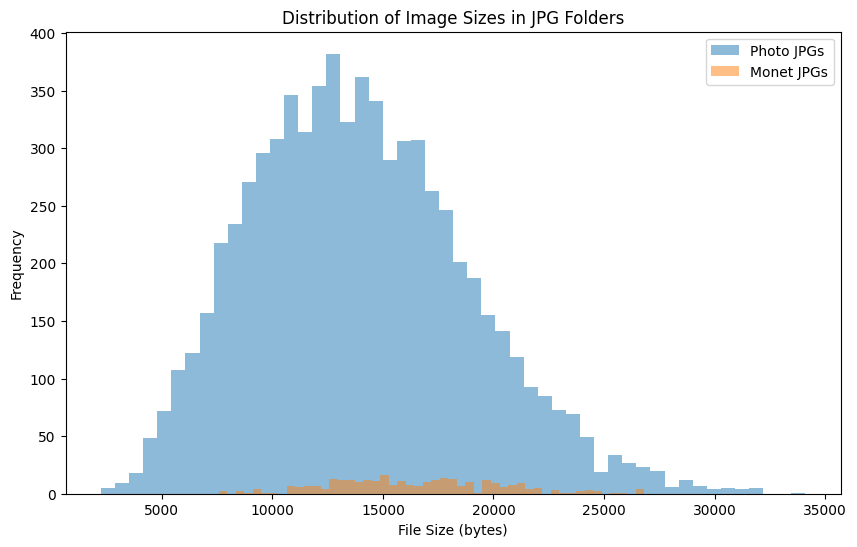

In [8]:
# Let's plot the image size of an random image tfrec folders and jpeg folders

import matplotlib.pyplot as plt
import numpy as np

photo_jpg_sizes = [os.path.getsize(file) for file in photo_jpg]
monet_jpg_sizes = [os.path.getsize(file) for file in monet_jpg]

plt.figure(figsize=(10, 6))
plt.hist(photo_jpg_sizes, bins=50, alpha=0.5, label='Photo JPGs')
plt.hist(monet_jpg_sizes, bins=50, alpha=0.5, label='Monet JPGs')
plt.xlabel('File Size (bytes)')
plt.ylabel('Frequency')
plt.title('Distribution of Image Sizes in JPG Folders')
plt.legend(loc='upper right')
plt.show()

We can see that the paintings are much smaller, making it more challenging to receive data and incorporate it into our bigger pictures.

In [9]:

jpg_directories = ['/content/monet_jpg', '/content/photo_jpg']

for directory in jpg_directories:
  image_path = os.path.join(directory, os.listdir(directory)[0])
  print (image_path)
  img = Image.open(image_path)

  # Get the width and height of the image
  width, height = img.size

  print(f"Image pixel size: {width}x{height}")

  file_paths = tf.io.gfile.glob(directory + '/*.jpg')
  for file_path in file_paths:
      try:
          img = Image.open(file_path)
          width, height = img.size


      except Exception as e:
          print(f"Error processing {file_path}: {e}")
          continue

/content/monet_jpg/6e0429f92e.jpg
Image pixel size: 256x256
/content/photo_jpg/fa307775e7.jpg
Image pixel size: 256x256


All the images are 256*256 pixels.

Let's make a function to read the tfr files containing more data.

In [10]:
def read_tfrecord(exm):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    exm = tf.io.parse_single_example(exm, tfrecord_format)
    img = tf.image.decode_jpeg(exm['image'], channels=3)
    # Normalize the image to [-1, 1]
    img = (tf.cast(img, tf.float32) / 127.5) - 1
    img = tf.reshape(img, [256, 256, 3])
    return img


Now we load our dataset.

In [11]:

def load_dataset(fileNames, labeled=True, ordered=False):
      # Read from TFRecords. For optimal performance, reading from multiple files at once and
      # disregarding data order. Order does not matter since we will be shuffling the data anyway.
      ignore_order = tf.data.Options()
      if not ordered:
          ignore_order.experimental_deterministic = False
      dataset = tf.data.TFRecordDataset(fileNames)
      dataset = dataset.map(read_tfrecord, num_parallel_calls = autotune)
      return dataset



In [12]:
monetDs = load_dataset(monetFilenames, labeled=True).batch(1)
photoDs = load_dataset(photoFilenames, labeled=True).batch(1)


In [13]:
monetDs

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>

The shape is as expected. Let's take a look at some of the pictures.

In [14]:
exmMonet = next(iter(monetDs))
exmPhoto = next(iter(photoDs))

print("Shape of the Monet image: " + str(exmMonet.shape))
print("Shape of the Photo image: " + str(exmPhoto.shape))

Shape of the Monet image: (1, 256, 256, 3)
Shape of the Photo image: (1, 256, 256, 3)


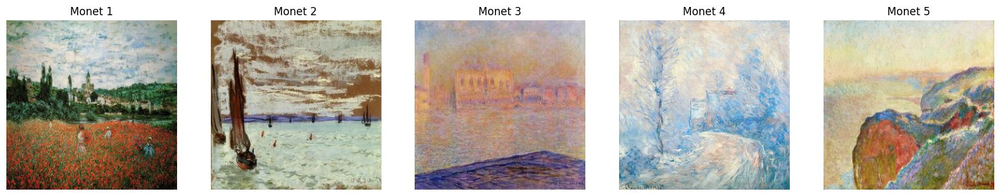

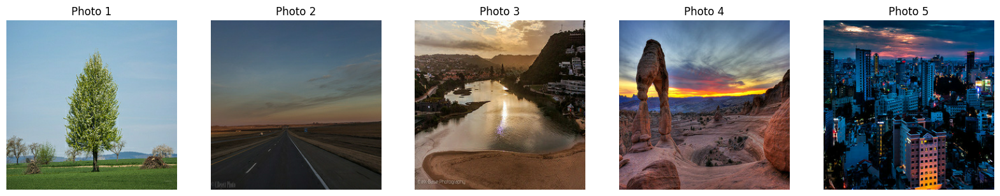

In [15]:
def display_samples(ds, title, samples = 5):
    plt.figure(figsize = (20, 8))
    for i, img in enumerate(ds.take(samples)):
        plt.subplot(1, samples, i + 1)
        plt.title(f'{title} {i + 1}')
        plt.imshow(img[0] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

display_samples(monetDs, 'Monet')
display_samples(photoDs, 'Photo')

Take the monetDs and photoDs datasets and create a new dataset where each element is a pair (a tuple) consisting of one Monet painting and one real photo.

In [16]:
#zip method combine two separate datasets, monetDs and photoDs, into a single dataset called train_dataset
#creates a new dataset where each element is a tuple containing corresponding elements from the input datasets.
train_dataset = tf.data.Dataset.zip((monetDs, photoDs))

train_dataset

<_ZipDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

# Model Architecture
This project explores several CycleGAN architectures to translate real-world photos into the style of Monet paintings. The CycleGAN model was selected for its ability to learn mappings between two image domains without requiring paired data, which is well-suited for this task where paired photos and Monet paintings are unavailable. CycleGANs consist of two generators and two discriminators working in tandem to achieve this image-to-image translation.

Here are the different model architectures used in this project.

### Model 1: The U-Net Generator

Generator: A U-Net-based generator was implemented for its ability to preserve high-frequency details crucial for artistic styles. The generator has a downsampling path (encoder) that captures image features at multiple resolutions and an upsampling path (decoder) that reconstructs images. It employs skip connections to bypass information between corresponding layers in the encoder and decoder, ensuring finer details are carried forward.
Discriminator: The discriminator is a convolutional neural network that aims to distinguish between real Monet paintings and generated images. It helps the generator improve the quality of generated outputs over time.
Reasoning: The U-Net is known for strong performance in image segmentation and generation tasks where detailed outputs are required, making it suitable for capturing and recreating the fine brushstrokes characteristic of Monet's work.

### Model 2: Deeper U-Net Generator and Deeper Discriminator

Generator: This model employed a deeper U-Net with more layers than Model 1. The downsampling path and upsampling path have more layers allowing the generator to capture more high-level and low-level features of the paintings. It employed skip connections like Model 1's U-Net.
Discriminator: This model utilized a deeper discriminator compared to Model 1. The deeper structure improves the discriminator's ability to differentiate between genuine and forged Monet paintings.
Reasoning: Increased depth could lead to enhanced performance by allowing the network to learn intricate and hierarchical features in both image domains, leading to a more nuanced conversion and increased image quality.

### Model 3: Updated Optimizers

Generator and Discriminator: These model uses the generator and discriminator architectures as Model 2 but change their optimizers. The model utilize the Adam optimizers with a higher learning rate (2e-3), without the beta_1 set to 0.5.
Reasoning: The change in optimizer is to discover if there would be any training improvements.

### Model 4: more Updated Optimizers

Generator and Discriminator: These model uses the generator and discriminator architectures as Model 2 and Model 3 but change their optimizers again. The model utilize the RMSprop optimizers with a learning rate (1e-4).
Reasoning: The change in optimizer is to discover if there would be any training improvements.


### important:
this code is not writen by me, it was taken from class CycleGan:
https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook

In [19]:
class CycleGAN(keras.Model):
    def __init__(self, monetGenerator, photoGenerator, monetDiscriminator, photoDiscriminator, lambda_cycle = 10):
        """
        Initializes the CycleGAN model.

        Args:
            monetGenerator: The generator that transforms photos to Monet-style paintings.
            photoGenerator: The generator that transforms Monet paintings to photos.
            monetDiscriminator: The discriminator that distinguishes real Monet paintings from fake ones.
            photoDiscriminator: The discriminator that distinguishes real photos from fake ones.
            lambda_cycle: The weight of the cycle consistency loss.
        """
        super(CycleGAN, self).__init__() #Corrected the indentation level of this line
        self.m_gen = monetGenerator
        self.p_gen = photoGenerator
        self.m_disc = monetDiscriminator
        self.p_disc = photoDiscriminator
        self.lambda_cycle = lambda_cycle

    def compile(self, m_gen_optimizer, p_gen_optimizer, m_disc_optimizer, p_disc_optimizer, gen_loss_fn, disc_loss_fn, cycle_loss_fn, identity_loss_fn):
        """
        Compiles the CycleGAN model, setting up optimizers and loss functions.

        Args:
            m_gen_optimizer: Optimizer for the Monet generator.
            p_gen_optimizer: Optimizer for the photo generator.
            m_disc_optimizer: Optimizer for the Monet discriminator.
            p_disc_optimizer: Optimizer for the photo discriminator.
            gen_loss_fn: Loss function for the generators (adversarial loss).
            disc_loss_fn: Loss function for the discriminators (adversarial loss).
            cycle_loss_fn: Loss function for cycle consistency.
            identity_loss_fn: Loss function for identity mapping.
        """
        super(CycleGAN, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        """
        Performs one training step of the CycleGAN model.

        Args:
            batch_data: A tuple containing a batch of real Monet paintings and real photos.

        Returns:
            A dictionary containing the losses for the generators and discriminators.
        """
        real_monet, real_photo = batch_data

        # Gradient tape uses memory to store intermediate results, including inputs and outputs, for use during the backwards pass.
        with tf.GradientTape(persistent=True) as tape:
            # Photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # Monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # Generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # Discriminator used to check inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # Discriminator used to check inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # Evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # Evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # Evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # Evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss, self.p_gen.trainable_variables)
        monet_discriminator_gradients = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients, self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients, self.p_gen.trainable_variables))
        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients, self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients, self.p_disc.trainable_variables))

        return {"monet_gen_loss": total_monet_gen_loss, "photo_gen_loss": total_photo_gen_loss, "monet_disc_loss": monet_disc_loss, "photo_disc_loss": photo_disc_loss}

These functions are fundamental building blocks for the CycleGAN model's generator, which is responsible for transforming images between the photo and Monet painting styles.

downsample Function **bold text**
This function is designed to reduce the spatial dimensions of an image while increasing the number of feature channels. It's a key part of the encoder in the generator.

**upsample Function**
This function increases the spatial dimensions of an image, essentially reversing the downsampling process. It's crucial in the decoder part of the generator.

In [24]:
def downsample(filters, kernel_size, apply_instance_norm=True, n_strides=2):
    """
    Downsamples an input image by reducing its spatial dimensions
    and increasing the number of feature channels.

    Args:
        filters (int): The number of filters (output channels) in the convolutional layer.
        kernel_size (int or tuple): The size of the convolutional kernel.
        apply_instance_norm (bool, optional): Whether to apply instance normalization. Defaults to True.
        n_strides (int, optional): The stride of the convolution, determining the downsampling factor. Defaults to 2.

    Returns:
        tf.keras.Sequential: A Keras Sequential model representing the downsampling block.
    """
    model = tf.keras.Sequential()
    model.add(Conv2D(filters, kernel_size, strides=n_strides, padding='same',
                     kernel_initializer=tf.keras.initializers.RandomNormal(0.0, 0.02),
                     use_bias=False))
    if apply_instance_norm:
        model.add(tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True,
                                                      beta_initializer="zeros", gamma_initializer="ones",
                                                      moving_mean_initializer="zeros", moving_variance_initializer="ones"))
    model.add(LeakyReLU(0.2))
    return model


def upsample(filters, kernel_size, apply_dropout=False):
    """
    Upsamples an input image by increasing its spatial dimensions
    and potentially applying dropout.

    Args:
        filters (int): The number of filters (output channels) in the transposed convolutional layer.
        kernel_size (int or tuple): The size of the transposed convolutional kernel.
        apply_dropout (bool, optional): Whether to apply dropout. Defaults to False.

    Returns:
        tf.keras.Sequential: A Keras Sequential model representing the upsampling block.
    """
    model = tf.keras.Sequential()
    model.add(Conv2DTranspose(filters, kernel_size, strides=2, padding='same',
                              kernel_initializer=tf.keras.initializers.RandomNormal(0.0, 0.02),
                              use_bias=False))
    model.add(tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True,
                                                     beta_initializer="zeros", gamma_initializer="ones",
                                                     moving_mean_initializer="zeros", moving_variance_initializer="ones"))
    if apply_dropout:
        model.add(Dropout(0.5))
    model.add(LeakyReLU(0.2))
    return model

The function generator1 defines a U-Net-based generator model. This U-Net generator aims to learn a mapping between two image domains by capturing and reconstructing image features at multiple resolutions. The skip connections help preserve details and improve the quality of the generated output.

In [25]:
def generator1():
    input= Input((256, 256, 3))
    x = input
    store = []
    for filter in [32, 64, 128, 256, 512]:
        x = downsample(filter, 4)(x)
        store.append(x)

    for filter in [512,256,128,64,32]:
        # Skip connections
        # Wrap tf.concat in a Keras Lambda layer
        x = tf.keras.layers.Lambda(lambda inputs: tf.concat([inputs[0], inputs[1]], axis=-1))([x, store.pop()])
        x = upsample(filter, 4)(x)

    x = Conv2DTranspose(3, 4, strides = 1, padding = 'same',kernel_initializer = tf.keras.initializers.RandomNormal(0.0, 0.02), activation = 'tanh',)(x)

    model = tf.keras.Model(input, x, name= 'unet_generator1')
    return model

generator1().summary()


Model: "unet_generator1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential (Sequential)   │ (None, 128, 128, 32)   │          1,664 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, 64, 64, 64)     │         33,024 │ sequential[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_2 (Sequential) │ (None, 32, 32, 128)    │        131,584 │ sequential_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_3 (Sequential) │ (None, 16, 16, 256)    │        525,312 │ sequential_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_4 (Sequential) │ (None, 8, 8, 512)      │      2,099,200 │ sequential_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 8, 8, 1024)     │              0 │ sequential_4[0][0],    │
│                           │                        │                │ sequential_4[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_5 (Sequential) │ (None, 16, 16, 512)    │      8,390,656 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 16, 16, 768)    │              0 │ sequential_5[0][0],    │
│                           │                        │                │ sequential_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_6 (Sequential) │ (None, 32, 32, 256)    │      3,146,752 │ lambda_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_2 (Lambda)         │ (None, 32, 32, 384)    │              0 │ sequential_6[0][0],    │
│                           │                        │                │ sequential_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_7 (Sequential) │ (None, 64, 64, 128)    │        786,944 │ lambda_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_3 (Lambda)         │ (None, 64, 64, 192)    │              0 │ sequential_7[0][0],    │
│                           │                        │                │ sequential_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_8 (Sequential) │ (None, 128, 128, 64)   │        196,864 │ lambda_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_4 (Lambda)         │ (None, 128, 128, 96)   │              0 │ sequential_8[0][0],    │
│                           │                        │                │ sequential[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_9 (Sequential) │ (None, 256, 256, 32)   │         49,280 │ lambda_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_5        │ (None, 256, 256, 3)    │          1,539 │ sequential_9[0][0]     │
│ (Conv2DTranspose)    

 Total params: 15,362,819 (58.60 MB)

 Trainable params: 15,358,851 (58.59 MB)

 Non-trainable params: 3,968 (15.50 KB)

This model takes an image input of shape (256, 256, 3) and processes it through a series of downsampling layers with increasing filters. Instance normalization is applied after certain downsampling steps. Finally, a convolutional layer with a single filter is used to produce the output.

In [26]:
def discriminator1():
    input = Input((256, 256, 3))
    x = input

    x = downsample(32, 4, apply_instance_norm = False)(x)
    x = downsample(64, 4, apply_instance_norm = True)(x)
    x = downsample(128, 4, apply_instance_norm = True)(x)
    x = downsample(256, 4, apply_instance_norm = True,)(x)
    x = downsample(256, 4, apply_instance_norm = True, n_strides = 1)(x)
    x = Conv2D(1, 4, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.RandomNormal(0.0, 0.02))(x)

    model = tf.keras.Model(input, x, name = 'discriminator1')

    return model

discriminator1().summary()

Model: "discriminator1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_10 (Sequential)           │ (None, 128, 128, 32)        │           1,536 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_11 (Sequential)           │ (None, 64, 64, 64)          │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_12 (Sequential)           │ (None, 32, 32, 128)         │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_13 (Sequential)           │ (None, 16, 16, 256)         │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_14 (Sequential)           │ (None, 16, 16, 256)         │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 16, 16, 1)           │           4,097 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,745,153 (6.66 MB)

 Trainable params: 1,743,745 (6.65 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [27]:
monetGenerator1 = generator1()
photoGenerator1 = generator1()

monetDiscriminator1 = discriminator1()
photoDiscriminator1 = discriminator1()

calculate the loss for a discriminator model.

In [28]:
def discriminator_loss_fn(real_predictions, fake_predictions):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)
    real_loss = bce(tf.ones_like(real_predictions), real_predictions)
    fake_loss = bce(tf.zeros_like(fake_predictions), fake_predictions)
    discriminator_loss = 0.5 * (real_loss + fake_loss)

    return discriminator_loss

calculate the loss for the generator in a Generative Adversarial Network (GAN). The generator aims to produce images that fool the discriminator.

In [29]:
def generator_loss_fn(fake_predictions):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits = True, reduction=tf.keras.losses.Reduction.NONE)
    generator_loss = bce(tf.ones_like(fake_predictions), fake_predictions)

    return generator_loss

This function calculates the cycle consistency loss, a crucial component of CycleGANs. Cycle consistency encourages the generators to preserve the original image content during the image-to-image translation process.

In [30]:
def cycle_loss_fn(real_image, cycled_image, LAMBDA):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    cycle_loss = LAMBDA * loss1

    return cycle_loss

Purpose: This function calculates the identity loss, another important component in CycleGANs. The identity loss encourages the generators to preserve the input image when the input and target domains are the same.

In [31]:
def identity_loss_fn(real_image, same_image, LAMBDA):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    identity_loss = LAMBDA * 0.5 * loss

    return identity_loss

In [32]:
monet_generator_optimizer1 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
photo_generator_optimizer1 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

monet_discriminator_optimizer1 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
photo_discriminator_optimizer1 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

Now let's train our first model

In [33]:
cycle_gan1 = CycleGAN(monetGenerator1, photoGenerator1, monetDiscriminator1, photoDiscriminator1)
cycle_gan1.compile(m_gen_optimizer = monet_generator_optimizer1, p_gen_optimizer = photo_generator_optimizer1, m_disc_optimizer = monet_discriminator_optimizer1, p_disc_optimizer = photo_discriminator_optimizer1, gen_loss_fn = generator_loss_fn, disc_loss_fn = discriminator_loss_fn, cycle_loss_fn = cycle_loss_fn, identity_loss_fn = identity_loss_fn)

startTime1 = time.time()
history1 = cycle_gan1.fit(train_dataset, epochs = 20)
endTime1 = time.time()

model1_train_time = round((endTime1 - startTime1) / 60, 3)
print(f"\nModel 1 Training Time = {model1_train_time} minutes")

Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 111s 106ms/step - monet_disc_loss: 0.6820 - monet_gen_loss: 7.2000 - photo_disc_loss: 0.6823 - photo_gen_loss: 7.3404
Epoch 2/20
  1/300 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - monet_disc_loss: 0.7202 - monet_gen_loss: 6.4793 - photo_disc_loss: 0.6153 - photo_gen_loss: 6.7835

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


300/300 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - monet_disc_loss: 0.6447 - monet_gen_loss: 6.5727 - photo_disc_loss: 0.6592 - photo_gen_loss: 6.6390
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - monet_disc_loss: 0.6428 - monet_gen_loss: 6.2261 - photo_disc_loss: 0.6388 - photo_gen_loss: 6.2954
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 32s 107ms/step - monet_disc_loss: 0.6461 - monet_gen_loss: 5.9582 - photo_disc_loss: 0.6322 - photo_gen_loss: 6.0526
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - monet_disc_loss: 0.6415 - monet_gen_loss: 5.7121 - photo_disc_loss: 0.6153 - photo_gen_loss: 5.8070
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 32s 107ms/step - monet_disc_loss: 0.6398 - monet_gen_loss: 5.4987 - photo_disc_loss: 0.6080 - photo_gen_loss: 5.5953
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - monet_disc_loss: 0.6296 - monet_gen_loss: 5.3276 - photo_disc_loss: 0.5979 - photo_gen_loss: 5.3834
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - monet_disc_l

In [34]:
#cycle_gan1.save('/content/drive/MyDrive/DTSA 5511/Week 5/cycle_gan1.keras')
#with open('/content/drive/MyDrive/DTSA 5511/Week 5/history1', 'wb') as file_pi:
#    pickle.dump(history1, file_pi)

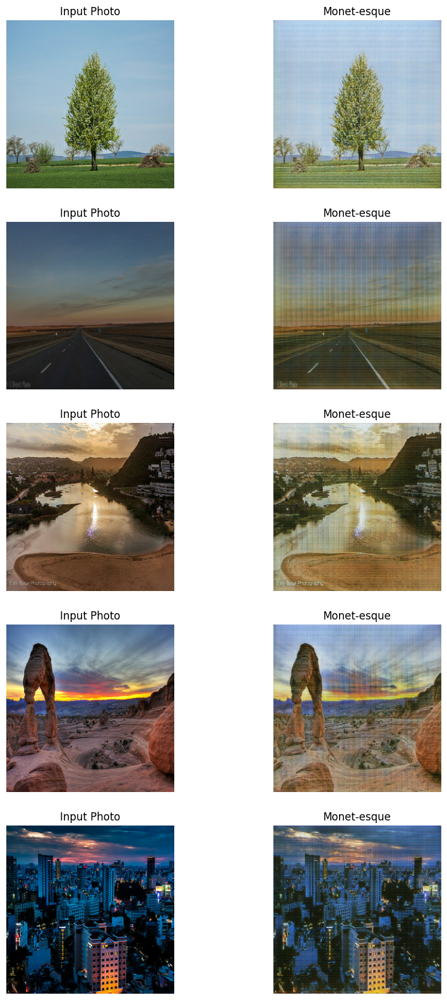

In [35]:
_, ax = plt.subplots(5, 2, figsize = (10, 20))
for i, img in enumerate(photoDs.take(5)):
    prediction = monetGenerator1(img, training = False)[0].numpy()

    # Ensure to recode the image back to the standard RGB range of 0 to 255.
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

The results look promising. Let's see if we can do better.

In [36]:
from tensorflow.keras.layers import Layer

class ConcatLayer(Layer):
    def __init__(self, axis=-1, **kwargs):
        super(ConcatLayer, self).__init__(**kwargs)
        self.axis = axis

    def call(self, inputs):
        return tf.concat(inputs, axis=self.axis)


def generator2():
    input = Input((256, 256, 3))
    x = input
    x = downsample(64, 4, apply_instance_norm=False)(x)
    store = []
    for filter in [128, 256, 512, 512, 512, 512, 512]:
        x = downsample(filter, 4)(x)
        store.append(x)

    for filter in [512, 512, 512]:
        # Skip connections
        # Use the custom ConcatLayer instead of tf.concat
        x = ConcatLayer(axis=-1)([x, store.pop()])
        x = upsample(filter, 4, apply_dropout=True)(x)

    for filter in [512, 256, 128, 64]:
        # Skip connections
        # Use the custom ConcatLayer instead of tf.concat
        x = ConcatLayer(axis=-1)([x, store.pop()])
        x = upsample(filter, 4)(x)

    x = Conv2DTranspose(3, 4, strides=2, padding='same',
                        kernel_initializer=tf.keras.initializers.RandomNormal(0.0, 0.02),
                        activation='tanh')(x)

    model = tf.keras.Model(input, x, name='unet_generator2')
    return model

generator2().summary()

Model: "unet_generator2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_51            │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_45             │ (None, 128, 128, 64)   │          3,072 │ input_layer_51[0][0]   │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_46             │ (None, 64, 64, 128)    │        131,584 │ sequential_45[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_47             │ (None, 32, 32, 256)    │        525,312 │ sequential_46[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_48             │ (None, 16, 16, 512)    │      2,099,200 │ sequential_47[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_49             │ (None, 8, 8, 512)      │      4,196,352 │ sequential_48[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_50             │ (None, 4, 4, 512)      │      4,196,352 │ sequential_49[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_51             │ (None, 2, 2, 512)      │      4,196,352 │ sequential_50[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_52             │ (None, 1, 1, 512)      │      4,196,352 │ sequential_51[0][0]    │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concat_layer              │ (None, 1, 1, 1024)     │              0 │ sequential_52[0][0],   │
│ (ConcatLayer)             │                        │                │ sequential_52[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_53             │ (None, 2, 2, 512)      │      8,390,656 │ concat_layer[0][0]     │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concat_layer_1            │ (None, 2, 2, 1024)     │              0 │ sequential_53[0][0],   │
│ (ConcatLayer)             │                        │                │ sequential_51[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_54             │ (None, 4, 4, 512)      │      8,390,656 │ concat_layer_1[0][0]   │
│ (Sequential)              │                        │                │                        │
├──────────────────────

 Total params: 58,617,091 (223.61 MB)

 Trainable params: 58,606,211 (223.56 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [37]:
def discriminator2():

    input = Input((256, 256, 3))
    x = input

    x = downsample(64, 4, apply_instance_norm = False)(x)
    x = downsample(128, 4, apply_instance_norm = True)(x)
    x = downsample(256, 4, apply_instance_norm = True)(x)
    x = downsample(512, 4, apply_instance_norm = True, n_strides = 1)(x)
    x = Conv2D(1, 4, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.RandomNormal(0.0, 0.02))(x)

    model = tf.keras.Model(input, x, name = 'discriminator2')

    return model

discriminator2().summary()

Model: "discriminator2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_67 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_60 (Sequential)           │ (None, 128, 128, 64)        │           3,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_61 (Sequential)           │ (None, 64, 64, 128)         │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_62 (Sequential)           │ (None, 32, 32, 256)         │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_63 (Sequential)           │ (None, 32, 32, 512)         │       2,099,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 32, 32, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,767,361 (10.56 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [38]:
monetGenerator2 = generator2()
photoGenerator2 = generator2()

monetDiscriminator2 = discriminator2()
photoDiscriminator2 = discriminator2()

In [39]:
monet_generator_optimizer2 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
photo_generator_optimizer2 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

monet_discriminator_optimizer2 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
photo_discriminator_optimizer2 = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

In [40]:
cycle_gan2 = CycleGAN(monetGenerator2, photoGenerator2, monetDiscriminator2, photoDiscriminator2)
cycle_gan2.compile(m_gen_optimizer = monet_generator_optimizer2, p_gen_optimizer = photo_generator_optimizer2, m_disc_optimizer = monet_discriminator_optimizer2, p_disc_optimizer = photo_discriminator_optimizer2, gen_loss_fn = generator_loss_fn, disc_loss_fn = discriminator_loss_fn, cycle_loss_fn = cycle_loss_fn, identity_loss_fn = identity_loss_fn)

startTime2 = time.time()
history2 = cycle_gan2.fit(train_dataset, epochs = 20)
endTime2 = time.time()

model2_train_time = round((endTime2 - startTime2) / 60, 3)
print(f"\nModel 2 Training Time = {model2_train_time} minutes")

Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 173s 218ms/step - monet_disc_loss: 0.6854 - monet_gen_loss: 7.4140 - photo_disc_loss: 0.6859 - photo_gen_loss: 7.5784
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6364 - monet_gen_loss: 6.4166 - photo_disc_loss: 0.6485 - photo_gen_loss: 6.4403
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6289 - monet_gen_loss: 5.7672 - photo_disc_loss: 0.6620 - photo_gen_loss: 5.7029
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6326 - monet_gen_loss: 5.3464 - photo_disc_loss: 0.6219 - photo_gen_loss: 5.3860
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6414 - monet_gen_loss: 5.1007 - photo_disc_loss: 0.6076 - photo_gen_loss: 5.2490
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6389 - monet_gen_loss: 4.9467 - photo_disc_loss: 0.5959 - photo_gen_loss: 5.1107
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 217ms/step - 

In [41]:
#cycle_gan2.save('/content/drive/MyDrive/DTSA 5511/Week 5/cycle_gan2.keras')
#with open('/content/drive/MyDrive/DTSA 5511/Week 5/history2', 'wb') as file_pi:
#    pickle.dump(history2, file_pi)

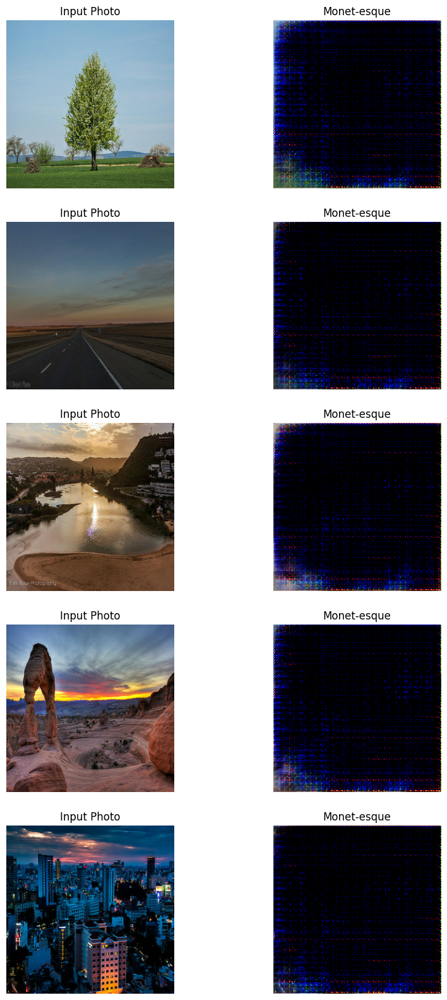

In [42]:
_, ax = plt.subplots(5, 2, figsize = (10, 20))
for i, img in enumerate(photoDs.take(5)):
    prediction = monetGenerator2(img, training = False)[0].numpy()

    # Ensure to recode the image back to the standard RGB range of 0 to 255.
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

Now, the results don't look good at all. Let's try to change the model again.

In [43]:
monetGenerator3 = generator2()
photoGenerator3 = generator2()

monetDiscriminator3 = discriminator2()
photoDiscriminator3 = discriminator2()

In [44]:
monet_generator_optimizer3 = tf.keras.optimizers.Adam(2e-3)
photo_generator_optimizer3 = tf.keras.optimizers.Adam(2e-3)

monet_discriminator_optimizer3 = tf.keras.optimizers.Adam(2e-3)
photo_discriminator_optimizer3 = tf.keras.optimizers.Adam(2e-3)

In [45]:
cycle_gan3 = CycleGAN(monetGenerator3, photoGenerator3, monetDiscriminator3, photoDiscriminator3)
cycle_gan3.compile(m_gen_optimizer = monet_generator_optimizer3, p_gen_optimizer = photo_generator_optimizer3, m_disc_optimizer = monet_discriminator_optimizer3, p_disc_optimizer = photo_discriminator_optimizer3, gen_loss_fn = generator_loss_fn, disc_loss_fn = discriminator_loss_fn, cycle_loss_fn = cycle_loss_fn, identity_loss_fn = identity_loss_fn)

startTime3 = time.time()
history3 = cycle_gan3.fit(train_dataset, epochs = 20)
endTime3 = time.time()

model3_train_time = round((endTime3 - startTime3) / 60, 3)
print(f"\nModel 3 Training Time = {model3_train_time} minutes")

Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 162s 219ms/step - monet_disc_loss: 0.7617 - monet_gen_loss: 7.7441 - photo_disc_loss: 0.7338 - photo_gen_loss: 7.8757
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 217ms/step - monet_disc_loss: 0.7018 - monet_gen_loss: 6.3637 - photo_disc_loss: 0.7077 - photo_gen_loss: 6.5162
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 217ms/step - monet_disc_loss: 0.7093 - monet_gen_loss: 5.6731 - photo_disc_loss: 0.6907 - photo_gen_loss: 5.8125
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 82s 218ms/step - monet_disc_loss: 0.7136 - monet_gen_loss: 5.4083 - photo_disc_loss: 0.6889 - photo_gen_loss: 5.5475
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 217ms/step - monet_disc_loss: 0.6969 - monet_gen_loss: 5.2512 - photo_disc_loss: 0.6824 - photo_gen_loss: 5.3616
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - monet_disc_loss: 0.6883 - monet_gen_loss: 5.0575 - photo_disc_loss: 0.6633 - photo_gen_loss: 5.1638
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 218ms/step - 

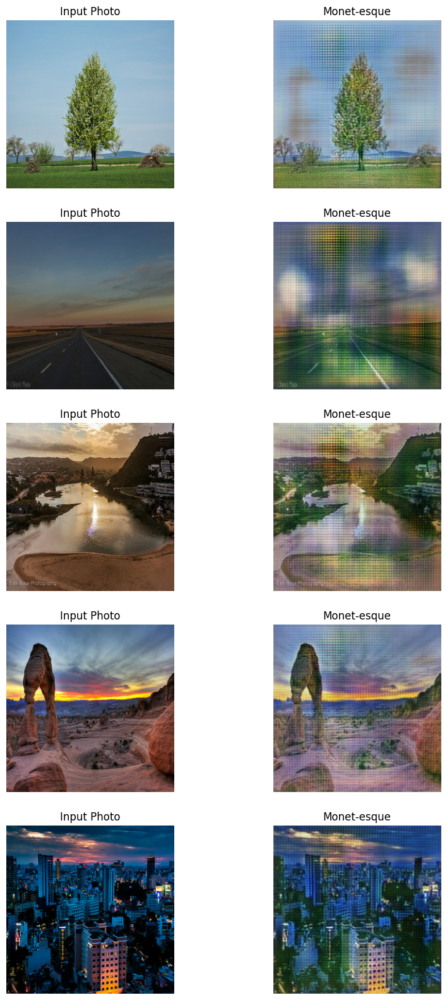

In [46]:
_, ax = plt.subplots(5, 2, figsize = (10, 20))
for i, img in enumerate(photoDs.take(5)):
    prediction = monetGenerator3(img, training=False)[0].numpy()

    # Ensure to recode the image back to the standard RGB range of 0 to 255.
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

The results are better than our first model. It looks very good. Let's give it one more try to tune the hyperparameters.

In [47]:
monetGenerator4 = generator2()
photoGenerator4 = generator2()

monetDiscriminator4 = discriminator2()
photoDiscriminator4 = discriminator2()

In [48]:
monet_generator_optimizer4 = tf.keras.optimizers.RMSprop(learning_rate=1e-4)
photo_generator_optimizer4 = tf.keras.optimizers.RMSprop(learning_rate=1e-4)

monet_discriminator_optimizer4 = tf.keras.optimizers.RMSprop(learning_rate=1e-4)
photo_discriminator_optimizer4 = tf.keras.optimizers.RMSprop(learning_rate=1e-4)

In [49]:
cycle_gan4 = CycleGAN(monetGenerator4, photoGenerator4, monetDiscriminator4, photoDiscriminator4)
cycle_gan4.compile(m_gen_optimizer = monet_generator_optimizer4, p_gen_optimizer = photo_generator_optimizer4, m_disc_optimizer = monet_discriminator_optimizer4, p_disc_optimizer = photo_discriminator_optimizer4, gen_loss_fn = generator_loss_fn, disc_loss_fn = discriminator_loss_fn, cycle_loss_fn = cycle_loss_fn, identity_loss_fn = identity_loss_fn)

startTime4 = time.time()
history4 = cycle_gan4.fit(train_dataset, epochs = 10)
endTime4 = time.time()

model4_train_time = round((endTime4 - startTime4) / 60, 3)
print(f"\nModel 4 Training Time = {model4_train_time} minutes")

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 149s 203ms/step - monet_disc_loss: 0.7113 - monet_gen_loss: 7.4767 - photo_disc_loss: 0.7026 - photo_gen_loss: 7.6334
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 92s 202ms/step - monet_disc_loss: 0.6214 - monet_gen_loss: 6.4636 - photo_disc_loss: 0.6206 - photo_gen_loss: 6.5431
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 199ms/step - monet_disc_loss: 0.6092 - monet_gen_loss: 5.8757 - photo_disc_loss: 0.6085 - photo_gen_loss: 5.9343
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 201ms/step - monet_disc_loss: 0.6196 - monet_gen_loss: 5.5073 - photo_disc_loss: 0.5980 - photo_gen_loss: 5.6057
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 200ms/step - monet_disc_loss: 0.6257 - monet_gen_loss: 5.3244 - photo_disc_loss: 0.5802 - photo_gen_loss: 5.4792
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 83s 202ms/step - monet_disc_loss: 0.6285 - monet_gen_loss: 5.1609 - photo_disc_loss: 0.5656 - photo_gen_loss: 5.3905
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 200ms/step - 

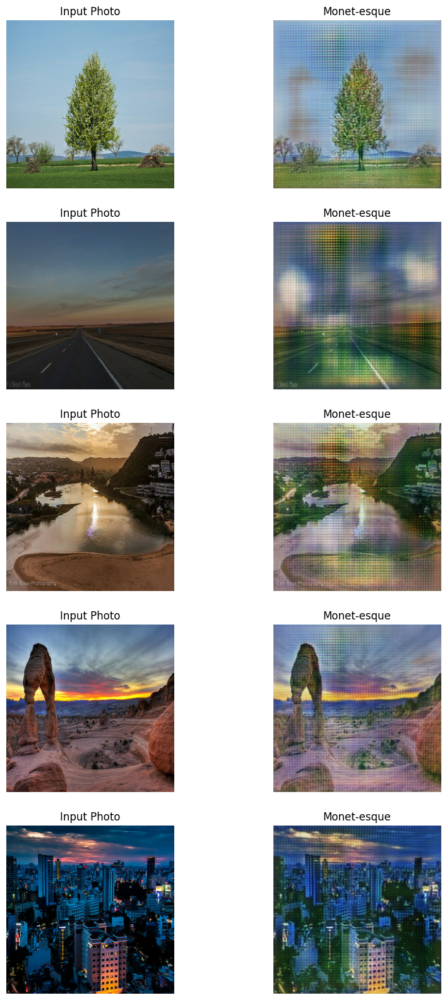

In [50]:
_, ax = plt.subplots(5, 2, figsize = (10, 20))
for i, img in enumerate(photoDs.take(5)):
    prediction = monetGenerator3(img, training=False)[0].numpy()

    # Ensure to recode the image back to the standard RGB range of 0 to 255.
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

Something went wrong. We will keep the third model.

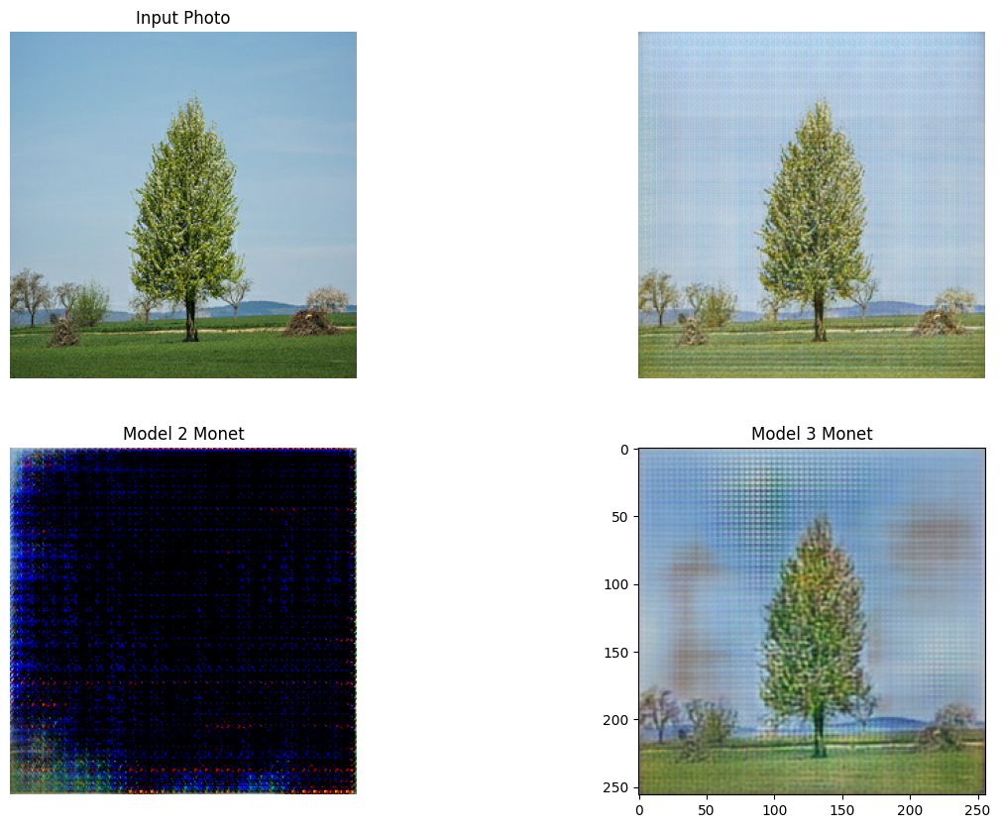

In [52]:
_, ax = plt.subplots(2, 2, figsize = (15, 10))
#for i, img in enumerate(photoDs.take(1)):

img = photoDs.take(1)
img = next(iter(img))

prediction1 = monetGenerator1(img, training=False)[0].numpy()
prediction2 = monetGenerator2(img, training=False)[0].numpy()
prediction3 = monetGenerator3(img, training=False)[0].numpy()
prediction4 = monetGenerator4(img, training=False)[0].numpy()

# Ensure to recode the image back to the standard RGB range of 0 to 255.
prediction1 = (prediction1 * 127.5 + 127.5).astype(np.uint8)
prediction2 = (prediction2 * 127.5 + 127.5).astype(np.uint8)
prediction3 = (prediction3 * 127.5 + 127.5).astype(np.uint8)
prediction4 = (prediction4 * 127.5 + 127.5).astype(np.uint8)
img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

ax[0, 0].imshow(img)
ax[0, 1].imshow(prediction1)
ax[1, 0].imshow(prediction2)
ax[1, 1].imshow(prediction3)
ax[0, 0].set_title("Input Photo")
ax[1, 1].set_title("Model 1 Monet")
ax[1, 0].set_title("Model 2 Monet")
ax[1, 1].set_title("Model 3 Monet")
ax[0, 0].axis("off")
ax[0, 1].axis("off")
ax[1, 0].axis("off")

plt.show()

# Results and Analysis

This project aimed to transform real-world photos into Monet-style paintings using CycleGANs. Four different CycleGAN architectures were explored, with visual inspection serving as the primary evaluation metric. The focus was on hyperparameter tuning, architectural variations, and training enhancements to achieve optimal results.

**Model Architectures and Hyperparameter Tuning**

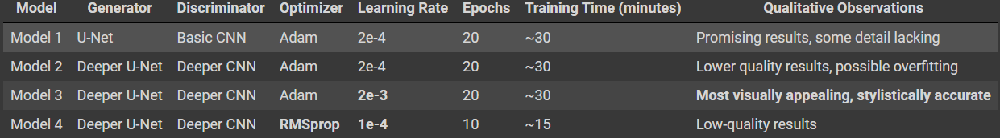


**Analysis of Architectural Variations**

U-Net Generator (Model 1): Showed promising initial results, highlighting the effectiveness of U-Net's skip connections in preserving image details during style transfer.
Deeper U-Net and Discriminator (Model 2): The increased depth did not lead to the expected performance improvement, potentially due to overfitting on the training dataset.
Impact of Optimizers: Model 3, using the Adam optimizer with a higher learning rate (2e-3), outperformed other configurations. This highlights the sensitivity of CycleGANs to optimizer choice.
RMSprop Optimizer (Model 4): Model 4's use of the RMSprop optimizer resulted in reduced training time but generated lower-quality results, further emphasizing the suitability of Adam for this task.
Performance Improvement Techniques

**Hyperparameter Tuning**
 Experimenting with different learning rates and optimizers proved crucial in finding an optimal configuration (Model 3).
Architectural Variations: Adjusting the depth of the generator and discriminator influenced image quality and model complexity, leading to insights about model suitability.
Troubleshooting and Observations

Overfitting (Model 2): The deeper architecture of Model 2 may have contributed to overfitting, requiring strategies like data augmentation or regularization for mitigation in future experiments.

Optimizer Impact: The choice of optimizer (Adam vs. RMSprop) had a significant impact on the quality of generated outputs.
Learning Rate: Increasing the learning rate in Model 3 improved performance, indicating that a careful balance of learning rate and optimization is essential.

**Hyperparameter Optimization Summary**

The primary hyperparameter optimization focused on:

Optimizer: Adam proved more effective than RMSprop for this image style transfer task.
Learning Rate: A higher learning rate (2e-3) for the Adam optimizer led to improved results.

# Conclusion
This project explored the application of CycleGANs for transforming real-world photos into Monet-style paintings. Four different model architectures with varying depths, optimizers, and hyperparameters were trained and evaluated. Visual inspection of the generated images revealed that the model architectures and hyperparameter choices significantly impacted the quality and style of the generated Monet-esque images.

## Learnings and Takeaways
What helped improve the performance:

1. Deeper U-Net Generator: Increasing the depth of the generator (Model 2) with additional layers allowed the model to capture a wider range of image features. However, this model with the default optimizer showed reduced image quality, highlighting the interaction between model depth and hyperparameters.

2. Updated Optimizers: Modifying the optimizer to Adam with an increased learning rate of 2e-3 (Model 3) resulted in significant improvements in image quality and style compared to Model 2. This suggests the learning rate is crucial in guiding the model to converge towards high-quality outputs.
What didn't help:

3. Deeper U-Net with Default Optimizer: Model 2, despite having a deeper architecture, generated blurry and noisy images when using the Adam optimizer with default settings, indicating potential overfitting.

4. RMSprop Optimizer: Model 4, utilizing the RMSprop optimizer with a learning rate of 1e-4, exhibited reduced image quality, suggesting that it wasn't as effective as Adam with an increased learning rate for this task.

## Future Improvements

Here are some areas for potential future improvements:

1. Fine-tuning Hyperparameters: Explore different values for learning rate, batch size, and other hyperparameters in more detail. This can further enhance the performance of the model. Consider using techniques like grid search or random search to optimize hyperparameters.
2. Experiment with Architectures: Investigate other model variations, such as adjusting skip connections in the U-Net or using alternative GAN architectures like ResNet-based generators.
3. Advanced Training Strategies: Try applying training techniques such as early stopping, learning rate schedules, or cyclical learning rates to further improve convergence and generalization.
4. Explore Adversarial Loss Functions: Investigate alternative adversarial loss functions like Wasserstein GAN (WGAN) or Least-Squares GAN (LSGAN) to potentially improve training stability and image quality.

# Summary

This project successfully demonstrated the feasibility of transforming photos into Monet-style paintings using CycleGANs. Hyperparameter tuning and architectural modifications played a significant role in determining the effectiveness of the models. By exploring the proposed improvements, the model can be further enhanced to achieve even more compelling and authentic results.



---



For the model submission to Kaggle, model 3 will be used.

In [ ]:
! mkdir ../images

import PIL
import shutil

save_dir = './Monet_output/'

i = 1
for img in photoDs:
    prediction = monetGenerator3(img, training = False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save(save_dir + str(i) + ".jpg")
    i += 1